In [37]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import pytesseract as pt
import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet

from glob import glob
from skimage import io
from shutil import copy
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [59]:
path = glob('placas/images/*.xml')
labels_dict = dict(filepath=[],xmin=[],xmax=[],ymin=[],ymax=[])

for filename in path:
    info = xet.parse(filename)
    root = info.getroot()
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)

    labels_dict['filepath'].append(filename)
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)

In [60]:
df = pd.DataFrame(labels_dict)
df.to_csv('labels.csv', index=False)
df.head()

,filepath,xmin,xmax,ymin,ymax
0,placas/images\N1.xml,1093,1396,645,727
1,placas/images\N100.xml,134,301,312,350
2,placas/images\N101.xml,31,139,128,161
3,placas/images\N102.xml,164,316,216,243
4,placas/images\N103.xml,813,1067,665,724


In [61]:
filename = df['filepath'][0]
def getFilename(filename):
    filename_image = xet.parse(filename).getroot().find('filename').text
    filepath_image = os.path.join('placas/images', filename_image)
    return filepath_image
getFilename(filename)

'placas/images\\N1.jpeg'

In [62]:
image_path = list(df['filepath'].apply(getFilename))
image_path[:10]

['placas/images\\N1.jpeg',
 'placas/images\\N100.jpeg',
 'placas/images\\N101.jpeg',
 'placas/images\\N102.jpeg',
 'placas/images\\N103.jpeg',
 'placas/images\\N104.jpeg',
 'placas/images\\N105.jpeg',
 'placas/images\\N106.jpeg',
 'placas/images\\N107.jpeg',
 'placas/images\\N108.jpeg']

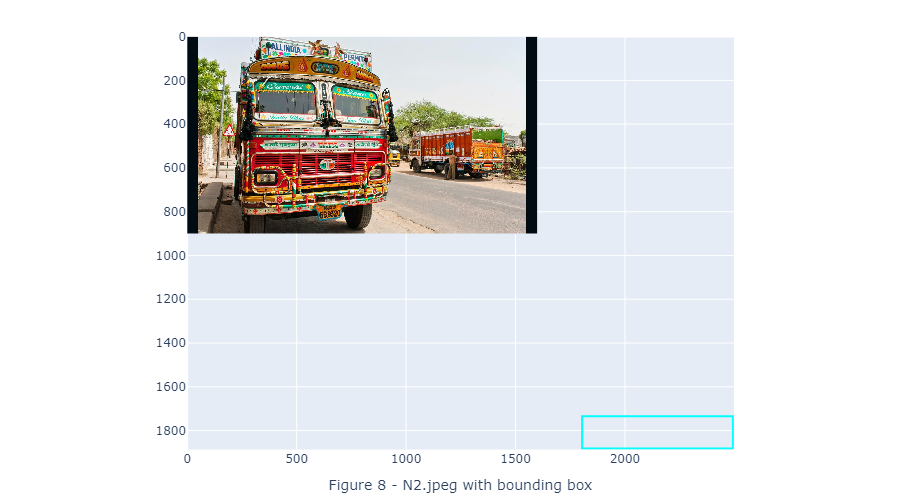

In [66]:
file_path = image_path[87]
img = cv2.imread(file_path)
img = io.imread(file_path)
fig = px.imshow(img)
fig.update_layout(width=600, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 8 - N2.jpeg with bounding box')
fig.add_shape(type='rect', x0=154, x1=267, y0=167, y1=189, xref='x', yref='y', line_color='cyan')

In [67]:
labels = df.iloc[:, 1:].values
data = []
output = []
for i in range(len(image_path)):
    image = image_path[i]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape

    load_image = load_img(image, target_size=(224,224))
    load_image_arr = img_to_array(load_image)
    norm_load_image_arr = load_image_arr/255.0

    xmin,xmax,ymin,ymax = labels[i]
    nxmin,nxmax = xmin/w,xmax/w
    nymin,nymax = ymin/h, ymax/h
    label_norm = (nxmin,nxmax,nymin,nymax)

    data.append(norm_load_image_arr)
    output.append(label_norm)

In [68]:
X = np.array(data, dtype=np.float32)
y = np.array(output, dtype=np.float32)

In [69]:
x_train, x_test, y_train, y_test = train_test_split(X,y,train_size=0.8,random_state=0)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((180, 224, 224, 3), (45, 224, 224, 3), (180, 4), (45, 4))

In [70]:
inception_resnet = InceptionResNetV2(weights="imagenet", include_top=False, input_tensor=Input(shape=(224,224,3)))
headmodel = inception_resnet.output
headmodel = Flatten()(headmodel)
headmodel = Dense(500, activation="relu")(headmodel)
headmodel = Dense(250, activation="relu")(headmodel)
headmodel = Dense(4, activation="sigmoid")(headmodel)

model = Model(inputs=inception_resnet.input, outputs=headmodel)

In [71]:
model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_406 (Conv2D)         (None, 111, 111, 32)         864       ['input_3[0][0]']             
                                                                                                  
 batch_normalization_406 (B  (None, 111, 111, 32)         96        ['conv2d_406[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_406 (Activation  (None, 111, 111, 32)         0         ['batch_normalization_40

In [72]:
tfb = TensorBoard('object_detection')
history = model.fit(x=x_train,y=y_train,batch_size=10,epochs=140,
                    validation_data=(x_test,y_test),callbacks=[tfb])

Epoch 1/140

18/18 [==============================] - 260s 8s/step - loss: 0.0484 - val_loss: 0.0341
Epoch 2/140
18/18 [==============================] - 137s 8s/step - loss: 0.0163 - val_loss: 0.0311
Epoch 3/140
18/18 [==============================] - 138s 8s/step - loss: 0.0100 - val_loss: 0.0235
Epoch 4/140
18/18 [==============================] - 131s 7s/step - loss: 0.0073 - val_loss: 0.0148
Epoch 5/140
18/18 [==============================] - 131s 7s/step - loss: 0.0050 - val_loss: 0.0120
Epoch 6/140
18/18 [==============================] - 128s 7s/step - loss: 0.0051 - val_loss: 0.0103
Epoch 7/140
18/18 [==============================] - 130s 7s/step - loss: 0.0037 - val_loss: 0.0106
Epoch 8/140
18/18 [==============================] - 157s 9s/step - loss: 0.0028 - val_loss: 0.0074
Epoch 9/140
18/18 [==============================] - 142s 8s/step - loss: 0.0024 - val_loss: 0.0077
Epoch 10/140
18/18 [==============================] - 138s 8s/step - loss: 0.0021 - val_loss: 0.006

In [73]:
model.save('./object_detection_final.h5')

c:\users\samsung\appdata\local\programs\python\python39\lib\site-packages\keras\src\engine\training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [15]:
!tensorboard --logdir="./object_detection_final"

^C


In [74]:
model = tf.keras.models.load_model('./object_detection_final.h5')
print('Model carregou')

Model carregou


In [75]:
path = './placas/TEST/TEST.jpeg'
image = load_img(path)
image = np.array(image, dtype=np.uint8)

image1 = load_img(path, target_size=(224,224))
image_arr_224 = img_to_array(image1)/255

h,w,d = image.shape
print('Heigh', h)
print('Width', w)

Heigh 729
Width 901


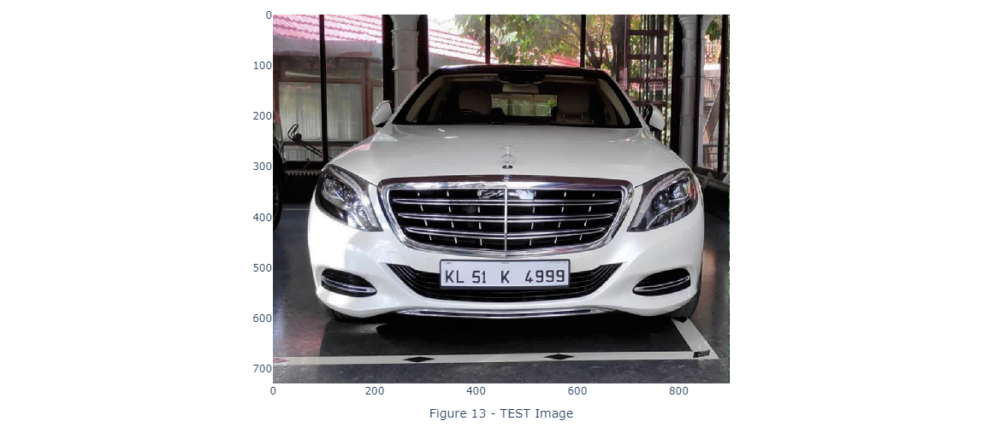

In [76]:
fig = px.imshow(image)
fig.update_layout(width=700, height=500,  margin=dict(l=10, r=10, b=10, t=10), xaxis_title='Figure 13 - TEST Image')

In [77]:
image_arr_224.shape

(224, 224, 3)

In [78]:
test_arr = image_arr_224.reshape(1, 224,224,3)
test_arr.shape

(1, 224, 224, 3)

In [79]:
coords = model.predict(test_arr)
coords

1/1 [==============================] - 7s 7s/step


array([[0.36053827, 0.6297625 , 0.64305705, 0.7366982 ]], dtype=float32)

In [80]:
denorm = np.array([w,w,h,h])
coords = coords*denorm
coords

array([[324.84498492, 567.41598612, 468.78858823, 537.05299526]])

In [81]:
coords = coords.astype(np.int32)
coords

array([[324, 567, 468, 537]])

In [82]:
xmin,xmax,ymin,ymax = coords[0]
pt1 = (xmin,ymin)
pt2 = (xmax,ymax)
print(pt1,pt2)

(324, 468) (567, 537)


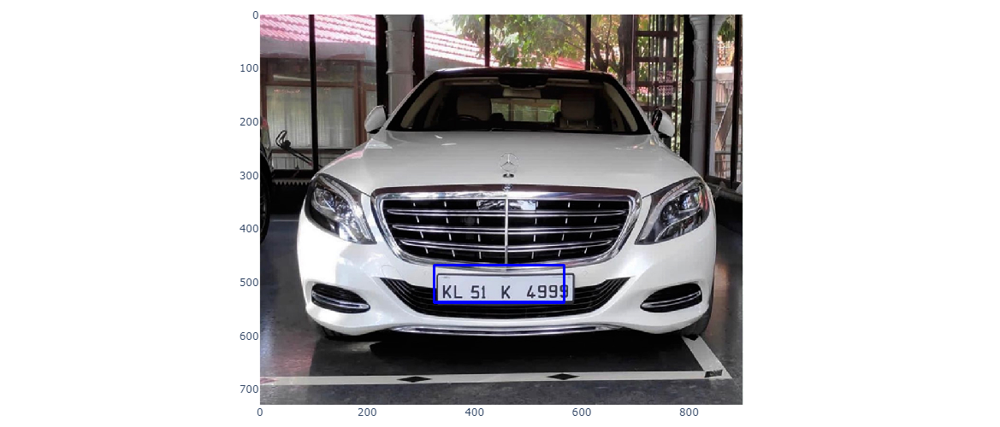

In [83]:
cv2.rectangle(image,pt1,pt2,(0,0,255),3)
fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10))

1/1 [==============================] - 0s 299ms/step
(324, 468) (567, 537)


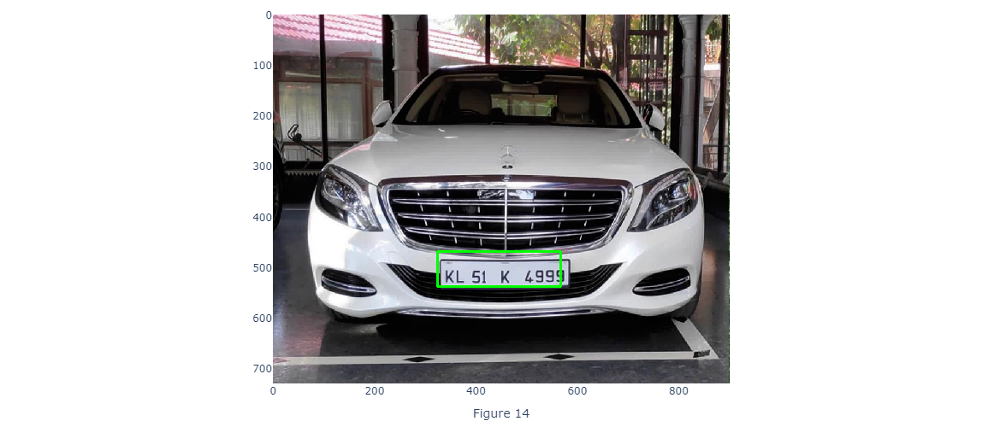

In [84]:
def object_detection(path):
    image = load_img(path)
    image = np.array(image,dtype=np.uint8)
    image1 = load_img(path, target_size=(224,224))

    image_arr_224 = img_to_array(image1)/255
    h,w,d = image.shape
    test_arr = image_arr_224.reshape(1,224,224,3)

    coords = model.predict(test_arr)

    denorm = np.array([w,w,h,h])
    coords = coords*denorm
    coords = coords.astype(np.int32)

    xmin,xmax,ymin,ymax = coords[0]
    pt1 = (xmin,ymin)
    pt2 = (xmax,ymax)

    print(pt1,pt2)
    cv2.rectangle(image, pt1, pt2, (0,255,0),3)
    return image, coords



1/1 [==============================] - 0s 252ms/step
(129, 155) (358, 232)


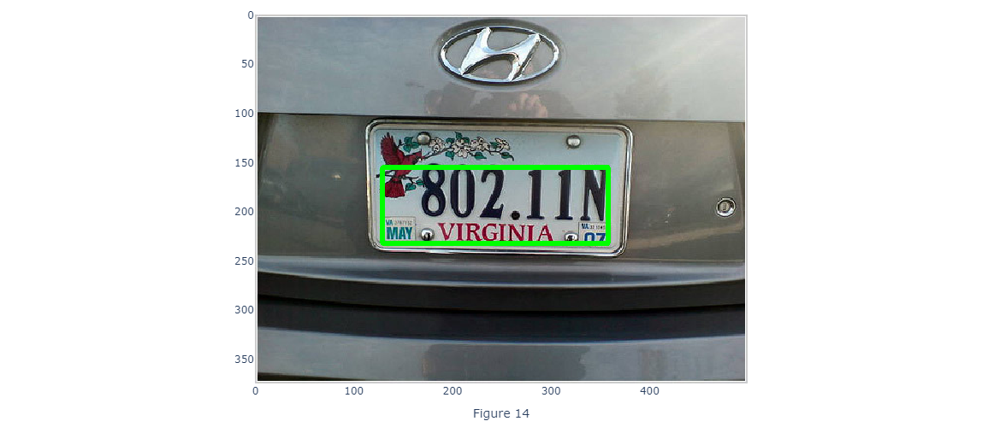

In [120]:
image, cods = object_detection("./archive/images/Cars6.png")

fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')

[129 358 155 232] (375, 500, 3) [[[  0 255   0]
  [  0 255   0]
  [  0 255   0]
  ...
  [  0 255   0]
  [  0 255   0]
  [  0 255   0]]

 [[  0 255   0]
  [  0 255   0]
  [  0 255   0]
  ...
  [  0 255   0]
  [  0 255   0]
  [  0 255   0]]

 [[  0 255   0]
  [  0 255   0]
  [  0 255   0]
  ...
  [  0 255   0]
  [  0 255   0]
  [  0 255   0]]

 ...

 [[  0 255   0]
  [  0 255   0]
  [  0 255   0]
  ...
  [177 187 189]
  [  0 255   0]
  [  0 255   0]]

 [[  0 255   0]
  [  0 255   0]
  [  0 255   0]
  ...
  [  0 255   0]
  [  0 255   0]
  [  0 255   0]]

 [[  0 255   0]
  [  0 255   0]
  [  0 255   0]
  ...
  [  0 255   0]
  [  0 255   0]
  [  0 255   0]]]


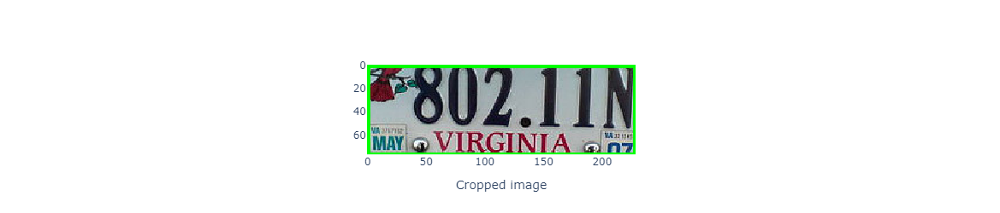

In [121]:
xmin,xmax,ymin,ymax = cods[0]
roi = image[ymin:ymax, xmin:xmax]
print(cods[0], image.shape, roi)

fig = px.imshow(roi)
fig.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Cropped image')

In [117]:
import pytesseract
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'
text = pt.image_to_string(roi)
print(text)

In [93]:
def denoise(image):
    return cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 15) 
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) #COLOR_BGR2GRAY)
def remove_noise(image, kernel=(6,6)):
    return cv2.blur(image, kernel)
def gaussian_filter(image, kernel=(5,5)):
    return cv2.GaussianBlur(image, kernel, 0)
def adaptive_th(image):
    return cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)
def dilate(image, i=2, kernel=(2,2)):
    kernel = np.ones(kernel, np.uint8)
    return cv2.dilate(image, kernel, iterations = i)
def erode(image, it=1, kernel=(2,2)):
    kernel = np.ones(kernel, np.uint8)
    return cv2.erode(image, kernel, iterations = it)
def opening(image):
    kernel = np.ones((2,2), np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
def canny(image):
    return cv2.Canny(image, 100, 200)
def log(image):
    image = cv2.GaussianBlur(image, (3, 3), 0)
    return cv2.Laplacian(image,cv2.CV_16S, ksize=3)
def threshold(image, limiar = 127, tipo=cv2.THRESH_BINARY):
    ret3,th3 = cv2.threshold(image,limiar,255,tipo) #| cv2.THRESH_OTSU)
    return th3
def bilateral_filter(image):
    return cv2.bilateralFilter(image, 13, 15, 15)

In [133]:
def encontrar_letras(img):
    letras = []
    gray = get_grayscale(img)
    limiar = threshold(gray, limiar=80, tipo=cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    #plt.imshow(limiar)
    #final_img = dilate(limiar, kernel=(2,2))
    #plt.imshow(final_img)
    #plt.imshow(final_img)
    text = pytesseract.image_to_string(limiar, config='--psm 11')
    return text, limiar


1/1 [==============================] - 0s 260ms/step
(125, 121) (291, 151)


('\\LR 486, |\n',
 array([[  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        ...,
        [  0,   0,   0, ..., 255,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8))

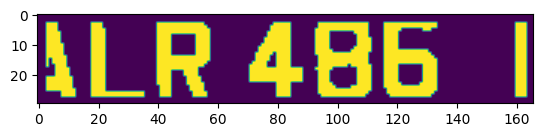

In [132]:
image, cods = object_detection("./archive/images/Cars14.png")
xmin,xmax,ymin,ymax = cods[0]
roi = image[ymin:ymax, xmin:xmax]
encontrar_letras(roi)

1/1 [==============================] - 0s 246ms/step
(147, 122) (261, 149)
1/1 [==============================] - 0s 253ms/step
(186, 203) (258, 223)
1/1 [==============================] - 0s 257ms/step
(136, 133) (261, 157)
1/1 [==============================] - 0s 252ms/step
(90, 105) (522, 212)
1/1 [==============================] - 0s 250ms/step
(170, 169) (258, 202)
1/1 [==============================] - 0s 250ms/step
(129, 155) (358, 232)
1/1 [==============================] - 0s 251ms/step
(153, 137) (226, 158)
1/1 [==============================] - 0s 253ms/step
(183, 101) (334, 130)
1/1 [==============================] - 0s 244ms/step
(161, 224) (277, 250)


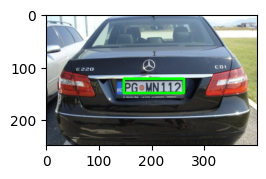

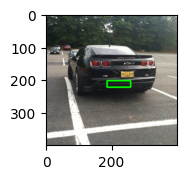

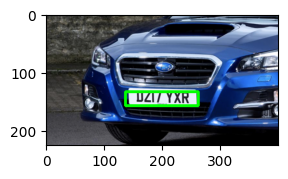

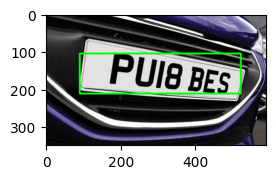

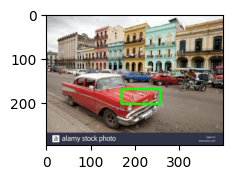

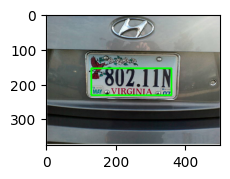

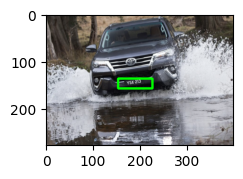

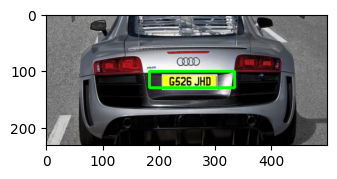

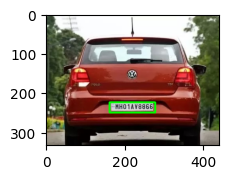

In [144]:
for i in range(1, 10):
    image, cods = object_detection("./archive/images/Cars"+str(i)+".png")
    xmin,xmax,ymin,ymax = cods[0]
    roi = image[ymin:ymax, xmin:xmax]
    fig = plt.figure(figsize=(20,20))
    subplt = fig.add_subplot(10, 2, i)
    plt.imshow(image)

1/1 [==============================] - 0s 385ms/step
(132, 97) (278, 149)
1/1 [==============================] - 0s 371ms/step
(134, 158) (260, 190)
1/1 [==============================] - 0s 322ms/step
(157, 133) (229, 157)
1/1 [==============================] - 1s 577ms/step
(145, 119) (250, 143)
1/1 [==============================] - 0s 387ms/step
(185, 225) (296, 259)
1/1 [==============================] - 0s 339ms/step
(145, 141) (236, 165)
1/1 [==============================] - 0s 382ms/step
(162, 139) (243, 156)
1/1 [==============================] - 0s 430ms/step
(132, 161) (496, 266)
1/1 [==============================] - 0s 392ms/step
(130, 151) (198, 172)
1/1 [==============================] - 0s 351ms/step
(121, 128) (183, 146)


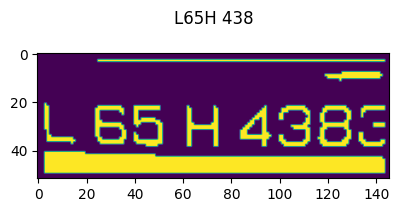

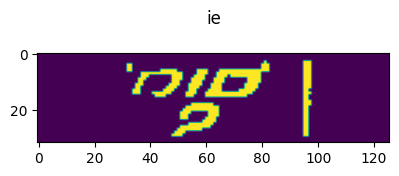

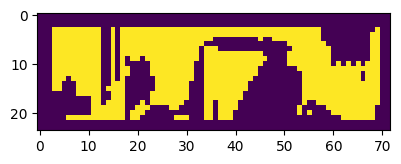

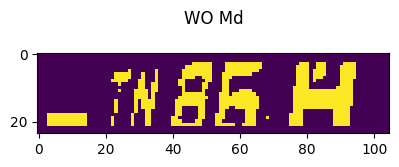

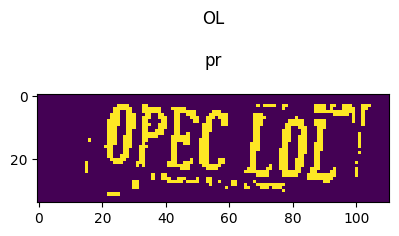

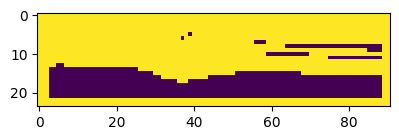

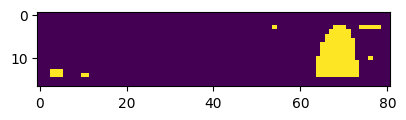

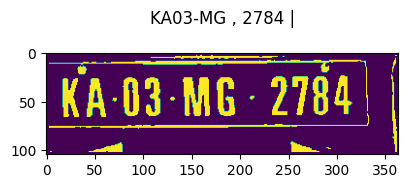

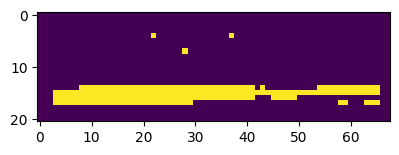

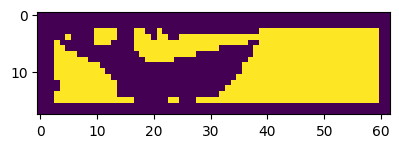

In [156]:
tot = 10
cont = 1
for i in range(212, 222):
    image, cods = object_detection("./archive/images/Cars"+str(i)+".png")
    xmin,xmax,ymin,ymax = cods[0]
    roi = image[ymin:ymax, xmin:xmax]
    letras, img = encontrar_letras(roi)
    fig = plt.figure(figsize=(10,10))
    subplt = fig.add_subplot(5, 2, cont)
    subplt.title.set_text(letras)
    cont += 1
    plt.imshow(img)

1/1 [==============================] - 4s 4s/step
(147, 122) (261, 149)


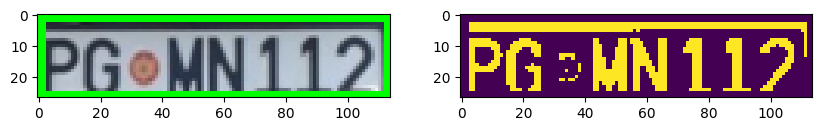

In [145]:
image, cods = object_detection("./archive/images/Cars1.png")
xmin,xmax,ymin,ymax = cods[0]
roi = image[ymin:ymax, xmin:xmax]
letras, img = encontrar_letras(roi)
fig = plt.figure(figsize=(10,10))
subplt = fig.add_subplot(1, 2, 1)
plt.imshow(roi)
subplt = fig.add_subplot(1, 2, 2)
plt.imshow(img)
